#  Question 1: What is the output of the model.summary()?

(400, 64, 64)
(400,)
40
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 64, 64, 8)         208       
                                                                 
 max_pooling2d_18 (MaxPooli  (None, 16, 16, 8)         0         
 ng2D)                                                           
                                                                 
 conv2d_19 (Conv2D)          (None, 16, 16, 16)        3216      
                                                                 
 max_pooling2d_19 (MaxPooli  (None, 4, 4, 16)          0         
 ng2D)                                                           
                                                                 
 conv2d_20 (Conv2D)          (None, 4, 4, 32)          4640      
                                                                 
 max_pooling2d_20 (MaxPooli  (

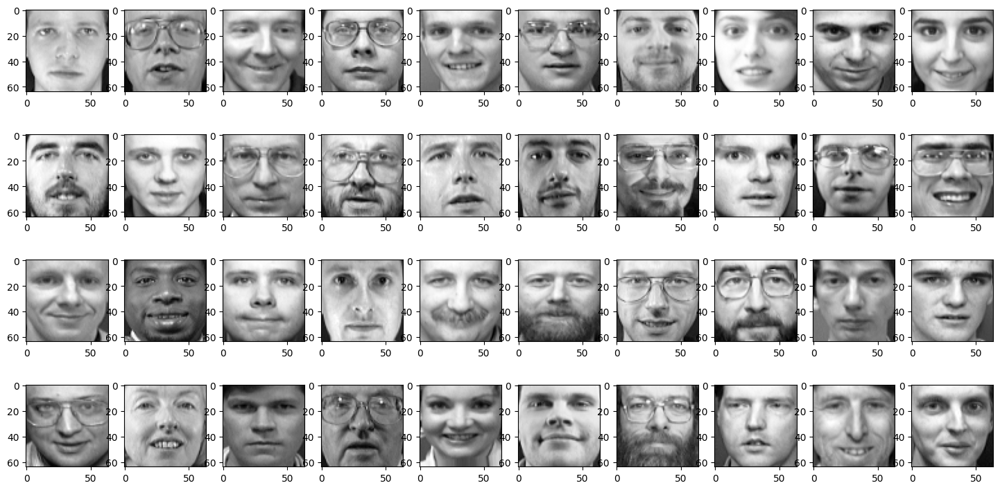

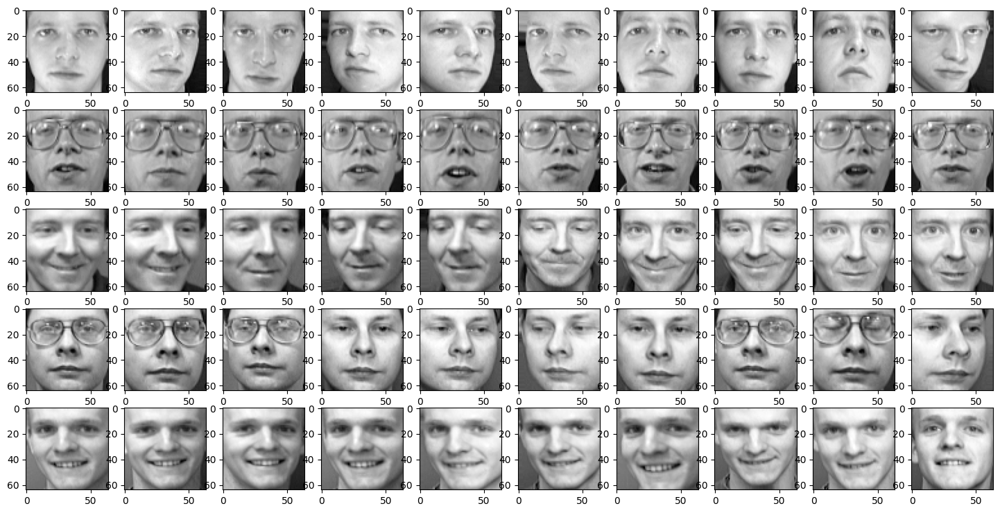

In [13]:
# Standard scientific Python imports
import numpy as np
import matplotlib.pyplot as plt
 
#Load data, face images and their target i.e. perosn number 
data = np.load("/kaggle/input/projectann/olivetti_faces.npy")
target = np.load("/kaggle/input/projectann/olivetti_faces_target.npy")

#print the size of data and target
#Data has 400 images of size 64 x 64 pixels (grayscale)
#Target has information about class of all 400 images
print(data.shape)
print(target.shape)

#Identity number of unique persons (ids) in the trarget data 
#For ORL / Olivetti face dataset this there are 40 people
#The dataset contains 10 images of each person. Therefore 40 x 10 = 400 images
unique_ids=np.unique(target)
print(len(unique_ids))

#Display one sample image for each person
#Display the 40 images in 4 rows with each row having 10 images
fig, axarr = plt.subplots(nrows=4, ncols=10, figsize=(18, 9))
axarr = axarr.flatten()
imgs=data
for id in unique_ids:
    img_id = id * 10
    axarr[id].imshow(imgs[img_id], cmap='gray')

#Display all 10 images of first 5 people
cols = 10
subject_ids=[0, 1, 2, 3, 4]
rows = (len(subject_ids)*10)//cols
fig, axarr = plt.subplots(nrows=rows, ncols=cols, figsize=(18, 9))
for i, subject_ids in enumerate(subject_ids):
    for j in range(cols):
        img_id = subject_ids*10 + j
        axarr[i, j].imshow(imgs[img_id], cmap='gray')

#Split the data into test and train data. Select test size = 20%
#Use sklearn library to split data into trianing and testing set
#X_train contains the image information and Y_train contains the target label (class)
#from sklearn.model_selection import train_test_split
#X_train, X_test, Y_train, Y_test = train_test_split(data, target, test_size = 0.2, random_state= 0)

#For training the data has to be split into training and validation, Split training data into training and validation set
#Set validation data size = 20% of training data
#X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size = 0.2, random_state = 0)

#Import keras for building the Convolutional Neural Network
from keras import utils as np_utils
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Dense, Dropout, Activation, Flatten

#Split the data into test and train data. Select test size = 20%
from sklearn.model_selection import train_test_split
target = np.load("/kaggle/input/projectann/olivetti_faces_target.npy")
target = np_utils.to_categorical(target, len(np.unique(target)))

#Use sklearn library to split data into trianing and testing set
#X_train contains the image information and Y_train contains the target label (class)
X_train, X_test, Y_train, Y_test = train_test_split(data, target, test_size = 0.2, random_state= 0)

#For training the data has to be split into training and validation, Split training data into training and validation set
#Set validation data size = 20% of training data
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size = 0.2, random_state = 0)

#target.shape

#Remember the third dimension is important for keras so specify that third dimension is 1   
X_train = X_train.reshape(X_train.shape[0], 64, 64, 1)
X_val = X_val.reshape(X_val.shape[0], 64, 64, 1)
X_test = X_test.reshape(X_test.shape[0], 64, 64, 1)


#Define the architecture of the convolutional neural network
model = Sequential()
#Add a conv layer having 8 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(8, (5, 5), activation='relu', input_shape=(64, 64, 1), padding='same'))
#Reduce the size of the images by 4 using maxpooling layer (image size 16 x 16)
model.add(MaxPooling2D(pool_size=(4, 4)))
#Add a conv layer having 16 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(16, (5, 5), activation='relu', padding='same'))
#Reduce the size of the images by 4 using maxpooling layer (image size 4 x 4)
model.add(MaxPooling2D(pool_size=(4, 4)))
#Add a conv layer having 16 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
#Reduce the size of the images by 2 using maxpooling layer (image size 2 x 2)
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(256, activation='sigmoid'))
#Pass data through a softmax layer
model.add(Dense(40, activation='softmax'))
#Since there are more than 2 classes use categorical_crossentropy, adam optimization and optimize based upon accuracy value
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

#Print a summary of the model
model.summary()

#Train the network using the above deinfed network architecture and give accuracy results for training and validation data
H1 = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=32, epochs=10, verbose=1)

# Question 2: What the initial training accuracy and validation accuracy of the CNN?

In [14]:

#initial training accuracy 
#Trloss, Traccuracy = model.evaluate(X_train, Y_train) 
#print(f'Train Accuracy: {Traccuracy}')
Traccuracy2 = H1.history["accuracy"][0]
print("Train Accuracy:",Traccuracy2)

#nitial validation accuracy 
#Valloss, Valaccuracy = model.evaluate(X_val, Y_val) 
#print(f'Validation Accuracy: {Valaccuracy}')
Valaccuracy2 = H1.history["val_accuracy"][0]
print("Validation Accuracy:",Valaccuracy2)

Train Accuracy: 0.01171875
Validation Accuracy: 0.015625


# Question 3: How many convolutional layers and pooling layers does this network have?

*  **convolutional layers = 3 layers** 
*  **pooling layers = 3 layers**

# Question 4: 
Generally, the larger the size of the image the more the information in it. The max-pooling layers after first and second Convolutional layer decrease the size of the image by 4. 

Check if this is causing the network to have such a poor validation accuracy?
**Yes it is causing the network to have a poor validation accuracy**

If the size of pooling layers size is changed from (4,4) to (2,2) what is the effect on accuracy of the network?
**The accuracy of the network has increased**

(400, 64, 64)
(400,)
40
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 64, 64, 8)         208       
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 32, 32, 8)         0         
 ng2D)                                                           
                                                                 
 conv2d_22 (Conv2D)          (None, 32, 32, 16)        3216      
                                                                 
 max_pooling2d_22 (MaxPooli  (None, 16, 16, 16)        0         
 ng2D)                                                           
                                                                 
 conv2d_23 (Conv2D)          (None, 16, 16, 32)        4640      
                                                                 
 max_pooling2d_23 (MaxPooli  (

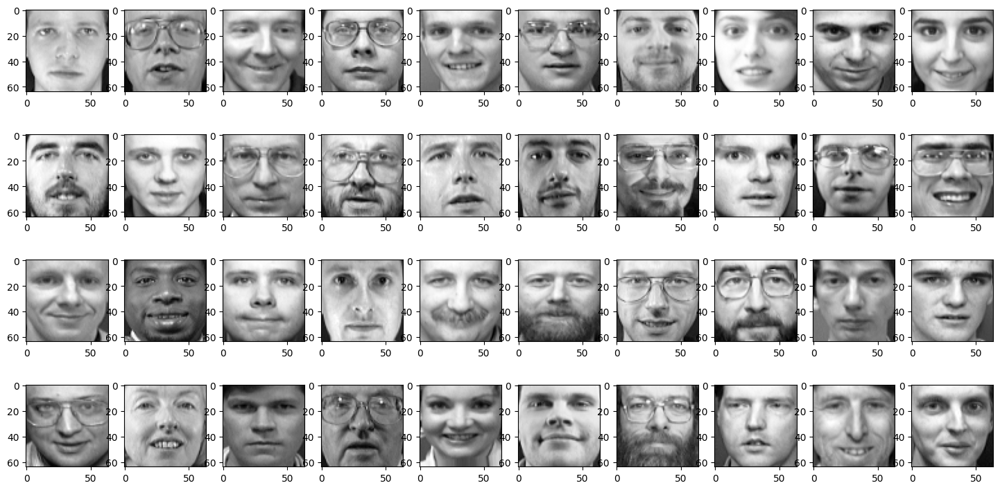

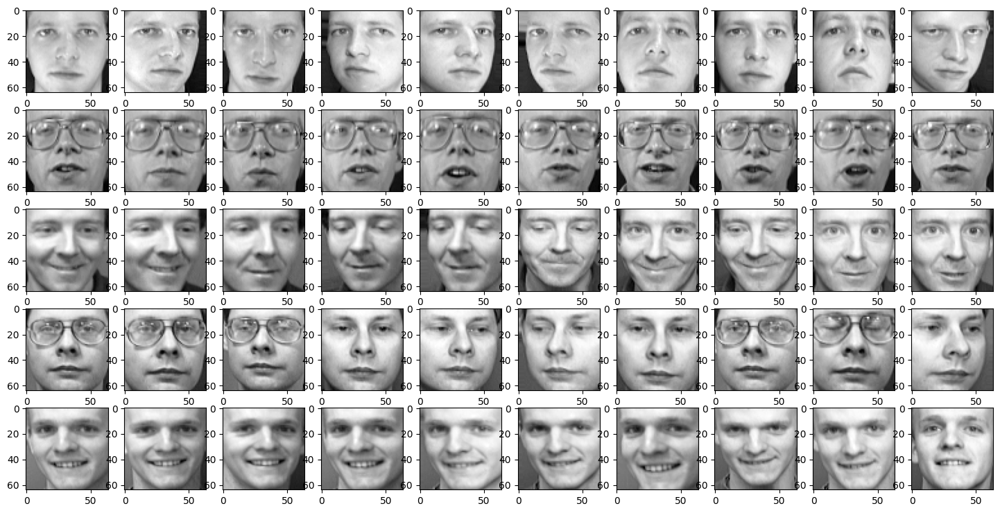

In [15]:
# Standard scientific Python imports
import numpy as np
import matplotlib.pyplot as plt

#Load data, face images and their target i.e. perosn number 
data = np.load("/kaggle/input/projectann/olivetti_faces.npy")
target = np.load("/kaggle/input/projectann/olivetti_faces_target.npy")

#print the size of data and target
#Data has 400 images of size 64 x 64 pixels (grayscale)
#Target has information about class of all 400 images
print(data.shape)
print(target.shape)

#Identity number of unique persons (ids) in the trarget data 
#For ORL / Olivetti face dataset this there are 40 people
#The dataset contains 10 images of each person. Therefore 40 x 10 = 400 images
unique_ids=np.unique(target)
print(len(unique_ids))

#Display one sample image for each person
#Display the 40 images in 4 rows with each row having 10 images
fig, axarr = plt.subplots(nrows=4, ncols=10, figsize=(18, 9))
axarr = axarr.flatten()
imgs=data
for id in unique_ids:
    img_id = id * 10
    axarr[id].imshow(imgs[img_id], cmap='gray')

#Display all 10 images of first 5 people
cols = 10
subject_ids=[0, 1, 2, 3, 4]
rows = (len(subject_ids)*10)//cols
fig, axarr = plt.subplots(nrows=rows, ncols=cols, figsize=(18, 9))
for i, subject_ids in enumerate(subject_ids):
    for j in range(cols):
        img_id = subject_ids*10 + j
        axarr[i, j].imshow(imgs[img_id], cmap='gray')

#Split the data into test and train data. Select test size = 20%
#Use sklearn library to split data into trianing and testing set
#X_train contains the image information and Y_train contains the target label (class)
#from sklearn.model_selection import train_test_split
#X_train, X_test, Y_train, Y_test = train_test_split(data, target, test_size = 0.2, random_state= 0)

#For training the data has to be split into training and validation, Split training data into training and validation set
#Set validation data size = 20% of training data
#X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size = 0.2, random_state = 0)

#Import keras for building the Convolutional Neural Network
from keras import utils as np_utils
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Dense, Dropout, Activation, Flatten

#Split the data into test and train data. Select test size = 20%
from sklearn.model_selection import train_test_split
target = np.load("/kaggle/input/projectann/olivetti_faces_target.npy")
target = np_utils.to_categorical(target, len(np.unique(target)))

#Use sklearn library to split data into trianing and testing set
#X_train contains the image information and Y_train contains the target label (class)
X_train, X_test, Y_train, Y_test = train_test_split(data, target, test_size = 0.2, random_state= 0)

#For training the data has to be split into training and validation, Split training data into training and validation set
#Set validation data size = 20% of training data
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size = 0.2, random_state = 0)

#target.shape

#Remember the third dimension is important for keras so specify that third dimension is 1   
X_train = X_train.reshape(X_train.shape[0], 64, 64, 1)
X_val = X_val.reshape(X_val.shape[0], 64, 64, 1)
X_test = X_test.reshape(X_test.shape[0], 64, 64, 1)


#Define the architecture of the convolutional neural network
model = Sequential()
#Add a conv layer having 8 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(8, (5, 5), activation='relu', input_shape=(64, 64, 1), padding='same'))
#Reduce the size of the images by 4 using maxpooling layer (image size 16 x 16)
model.add(MaxPooling2D(pool_size=(2, 2)))
#Add a conv layer having 16 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(16, (5, 5), activation='relu', padding='same'))
#Reduce the size of the images by 4 using maxpooling layer (image size 4 x 4)
model.add(MaxPooling2D(pool_size=(2, 2)))
#Add a conv layer having 16 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
#Reduce the size of the images by 2 using maxpooling layer (image size 2 x 2)
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(256, activation='sigmoid'))
#Pass data through a softmax layer
model.add(Dense(40, activation='softmax'))
#Since there are more than 2 classes use categorical_crossentropy, adam optimization and optimize based upon accuracy value
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

#Print a summary of the model
model.summary()

#Train the network using the above deinfed network architecture and give accuracy results for training and validation data
H2 = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=32, epochs=10, verbose=1)

In [16]:
Valaccuracy2 = H2.history["val_accuracy"][0]
print("Initial Validation Accuracy:",Valaccuracy2)

Valaccuracy2 = H2.history["val_accuracy"][9]
print("Final Validation Accuracy:",Valaccuracy2)

Initial Validation Accuracy: 0.0
Final Validation Accuracy: 0.609375


# Question 5:
Dr. Hinton, has highlighted that aggressively using pooling layers may result in loss of important information. Is there a way that the CNN architecture starts producing better training and validation accuracy?

**We have Many ways to produce a better training and validation accuracy Here are Some of them:**

* **Increasing model complexity: Adding more layers or increasing the number of filters in the convolutional layers can increase the model's capacity to capture complex patterns and features.**

* **Adjusting hyperparameters: Experimenting with different hyperparameter values, such as the pooling layer size, kernel size, or stride, can help find the optimal configuration for your specific task and dataset.**


# Question 6: 
Make changes to the convolutional neural network to get the best validation accuracy. You are not allowed to change the number of epochs or batch size for this task.

**We change the number of filters in each Convolutional layer and the size of the filters in each Convolutional layer**
* **first Convolutional layer we change The size of the filter(7,7)**
* **Second Convolutional layer we change The number of filters to 32 and The size of the filter (7,7)**
* **Third Convolutional layer we change The number of filters to 64 and The size of the filter (5,5)**

(400, 64, 64)
(400,)
40
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 64, 64, 8)         400       
                                                                 
 max_pooling2d_24 (MaxPooli  (None, 32, 32, 8)         0         
 ng2D)                                                           
                                                                 
 conv2d_25 (Conv2D)          (None, 32, 32, 32)        12576     
                                                                 
 max_pooling2d_25 (MaxPooli  (None, 16, 16, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_26 (Conv2D)          (None, 16, 16, 64)        51264     
                                                                 
 max_pooling2d_26 (MaxPooli  (

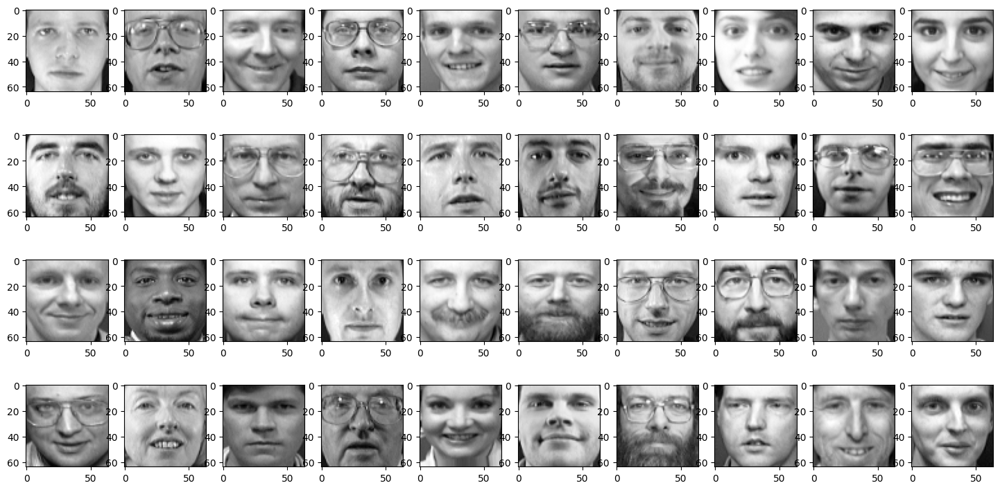

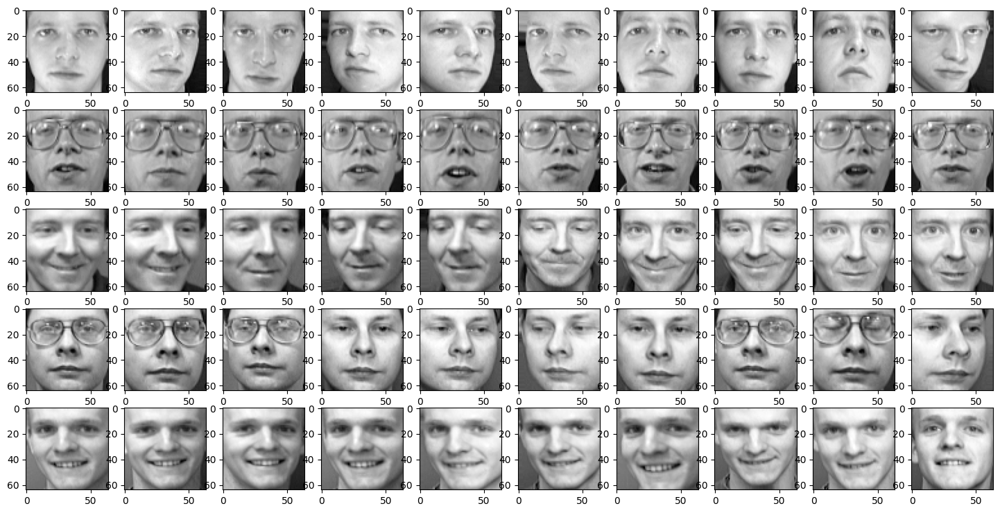

In [17]:
# Standard scientific Python imports
import numpy as np
import matplotlib.pyplot as plt

#Load data, face images and their target i.e. perosn number 
data = np.load("/kaggle/input/projectann/olivetti_faces.npy")
target = np.load("/kaggle/input/projectann/olivetti_faces_target.npy")

#print the size of data and target
#Data has 400 images of size 64 x 64 pixels (grayscale)
#Target has information about class of all 400 images
print(data.shape)
print(target.shape)

#Identity number of unique persons (ids) in the trarget data 
#For ORL / Olivetti face dataset this there are 40 people
#The dataset contains 10 images of each person. Therefore 40 x 10 = 400 images
unique_ids=np.unique(target)
print(len(unique_ids))

#Display one sample image for each person
#Display the 40 images in 4 rows with each row having 10 images
fig, axarr = plt.subplots(nrows=4, ncols=10, figsize=(18, 9))
axarr = axarr.flatten()
imgs=data
for id in unique_ids:
    img_id = id * 10
    axarr[id].imshow(imgs[img_id], cmap='gray')

#Display all 10 images of first 5 people
cols = 10
subject_ids=[0, 1, 2, 3, 4]
rows = (len(subject_ids)*10)//cols
fig, axarr = plt.subplots(nrows=rows, ncols=cols, figsize=(18, 9))
for i, subject_ids in enumerate(subject_ids):
    for j in range(cols):
        img_id = subject_ids*10 + j
        axarr[i, j].imshow(imgs[img_id], cmap='gray')

#Split the data into test and train data. Select test size = 20%
#Use sklearn library to split data into trianing and testing set
#X_train contains the image information and Y_train contains the target label (class)
#from sklearn.model_selection import train_test_split
#X_train, X_test, Y_train, Y_test = train_test_split(data, target, test_size = 0.2, random_state= 0)

#For training the data has to be split into training and validation, Split training data into training and validation set
#Set validation data size = 20% of training data
#X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size = 0.2, random_state = 0)

#Import keras for building the Convolutional Neural Network
from keras import utils as np_utils
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Dense, Dropout, Activation, Flatten

#Split the data into test and train data. Select test size = 20%
from sklearn.model_selection import train_test_split
target = np.load("/kaggle/input/projectann/olivetti_faces_target.npy")
target = np_utils.to_categorical(target, len(np.unique(target)))

#Use sklearn library to split data into trianing and testing set
#X_train contains the image information and Y_train contains the target label (class)
X_train, X_test, Y_train, Y_test = train_test_split(data, target, test_size = 0.2, random_state= 0)

#For training the data has to be split into training and validation, Split training data into training and validation set
#Set validation data size = 20% of training data
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size = 0.2, random_state = 0)

#target.shape

#Remember the third dimension is important for keras so specify that third dimension is 1   
X_train = X_train.reshape(X_train.shape[0], 64, 64, 1)
X_val = X_val.reshape(X_val.shape[0], 64, 64, 1)
X_test = X_test.reshape(X_test.shape[0], 64, 64, 1)


#Define the architecture of the convolutional neural network
model = Sequential()
#Add a conv layer having 16 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(8, (7, 7), activation='relu', input_shape=(64, 64, 1), padding='same'))
#Reduce the size of the images by 4 using maxpooling layer (image size 16 x 16)
model.add(MaxPooling2D(pool_size=(2, 2)))
#Add a conv layer having 32 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(32, (7, 7), activation='relu', padding='same'))
#Reduce the size of the images by 4 using maxpooling layer (image size 4 x 4)
model.add(MaxPooling2D(pool_size=(2, 2)))
#Add a conv layer having 64 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(64, (5, 5), activation='relu', padding='same'))
#Reduce the size of the images by 2 using maxpooling layer (image size 2 x 2)
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(256, activation='sigmoid'))
#Pass data through a softmax layer
model.add(Dense(40, activation='softmax'))
#Since there are more than 2 classes use categorical_crossentropy, adam optimization and optimize based upon accuracy value
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

#Print a summary of the model
model.summary()
#Train the network using the above deinfed network architecture and give accuracy results for training and validation data
H4 = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=32, epochs=10, verbose=1)

In [18]:
#Initial validation accuracy 
Valaccuracy2 = H4.history["val_accuracy"][0]
print("Initial Validation Accuracy:",Valaccuracy2)

#Final validation accuracy 
Valaccuracy3 = H4.history["val_accuracy"][9]
print("Final Validation Accuracy:",Valaccuracy3)

Initial Validation Accuracy: 0.0
Final Validation Accuracy: 0.703125


# Question 7: Plot the difference between training and validation accuracy for each epoch.

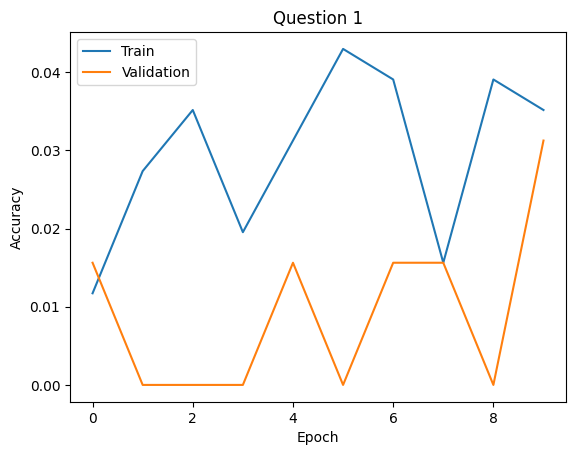

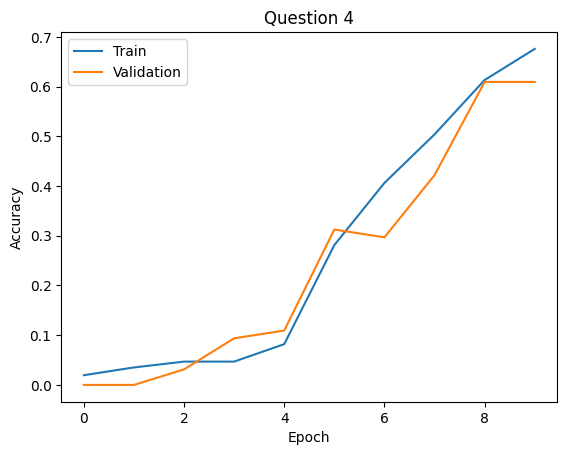

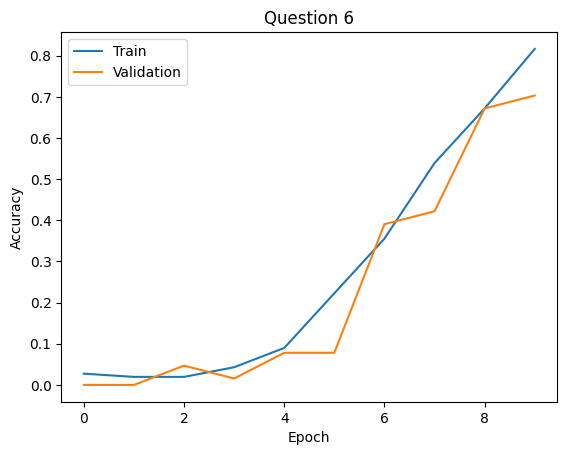

In [19]:
# Plot the difference between training and validation accuracy for each epoch
plt.plot(H1.history['accuracy'])
plt.plot(H1.history['val_accuracy'])
plt.title('Question 1')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot the difference between training and validation accuracy for each epoch
plt.plot(H2.history['accuracy'])
plt.plot(H2.history['val_accuracy'])
plt.title('Question 4')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot the difference between training and validation accuracy for each epoch
plt.plot(H4.history['accuracy'])
plt.plot(H4.history['val_accuracy'])
plt.title('Question 6')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Question 8: 
For the best network architecture change the batch size to 16 and plot the training vs
validation accuracy graph. What happened to the validation accuracy after last epoch as compared
to when the batch size was 32.

(400, 64, 64)
(400,)
40
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_27 (Conv2D)          (None, 64, 64, 8)         400       
                                                                 
 max_pooling2d_27 (MaxPooli  (None, 32, 32, 8)         0         
 ng2D)                                                           
                                                                 
 conv2d_28 (Conv2D)          (None, 32, 32, 32)        12576     
                                                                 
 max_pooling2d_28 (MaxPooli  (None, 16, 16, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_29 (Conv2D)          (None, 16, 16, 64)        51264     
                                                                 
 max_pooling2d_29 (MaxPooli  (

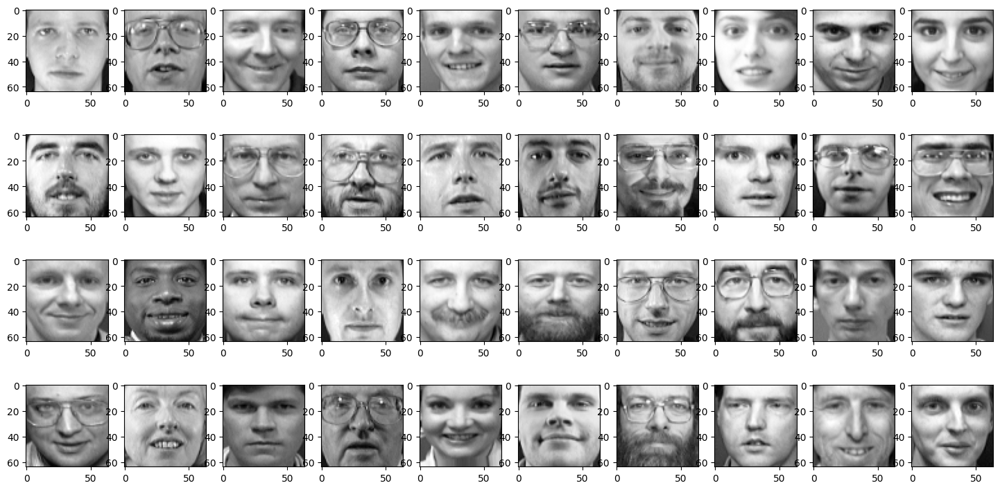

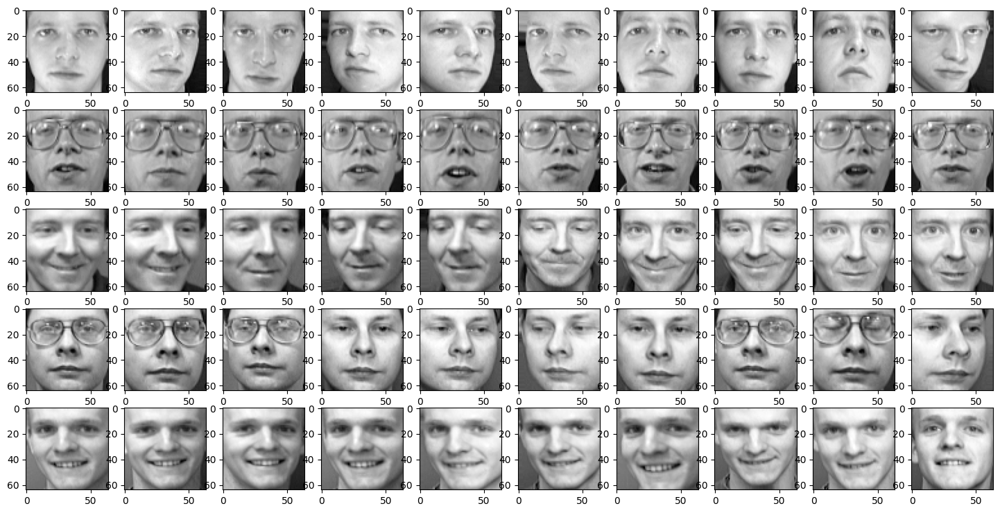

In [20]:
# Standard scientific Python imports
import numpy as np
import matplotlib.pyplot as plt
 
#Load data, face images and their target i.e. perosn number 
data = np.load("/kaggle/input/projectann/olivetti_faces.npy")
target = np.load("/kaggle/input/projectann/olivetti_faces_target.npy")

#print the size of data and target
#Data has 400 images of size 64 x 64 pixels (grayscale)
#Target has information about class of all 400 images
print(data.shape)
print(target.shape)

#Identity number of unique persons (ids) in the trarget data 
#For ORL / Olivetti face dataset this there are 40 people
#The dataset contains 10 images of each person. Therefore 40 x 10 = 400 images
unique_ids=np.unique(target)
print(len(unique_ids))

#Display one sample image for each person
#Display the 40 images in 4 rows with each row having 10 images
fig, axarr = plt.subplots(nrows=4, ncols=10, figsize=(18, 9))
axarr = axarr.flatten()
imgs=data
for id in unique_ids:
    img_id = id * 10
    axarr[id].imshow(imgs[img_id], cmap='gray')

#Display all 10 images of first 5 people
cols = 10
subject_ids=[0, 1, 2, 3, 4]
rows = (len(subject_ids)*10)//cols
fig, axarr = plt.subplots(nrows=rows, ncols=cols, figsize=(18, 9))
for i, subject_ids in enumerate(subject_ids):
    for j in range(cols):
        img_id = subject_ids*10 + j
        axarr[i, j].imshow(imgs[img_id], cmap='gray')

#Split the data into test and train data. Select test size = 20%
#Use sklearn library to split data into trianing and testing set
#X_train contains the image information and Y_train contains the target label (class)
#from sklearn.model_selection import train_test_split
#X_train, X_test, Y_train, Y_test = train_test_split(data, target, test_size = 0.2, random_state= 0)

#For training the data has to be split into training and validation, Split training data into training and validation set
#Set validation data size = 20% of training data
#X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size = 0.2, random_state = 0)

#Import keras for building the Convolutional Neural Network
from keras import utils as np_utils
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Dense, Dropout, Activation, Flatten

#Split the data into test and train data. Select test size = 20%
from sklearn.model_selection import train_test_split
target = np.load("/kaggle/input/projectann/olivetti_faces_target.npy")
target = np_utils.to_categorical(target, len(np.unique(target)))

#Use sklearn library to split data into trianing and testing set
#X_train contains the image information and Y_train contains the target label (class)
X_train, X_test, Y_train, Y_test = train_test_split(data, target, test_size = 0.2, random_state= 0)

#For training the data has to be split into training and validation, Split training data into training and validation set
#Set validation data size = 20% of training data
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size = 0.2, random_state = 0)

#target.shape

#Remember the third dimension is important for keras so specify that third dimension is 1   
X_train = X_train.reshape(X_train.shape[0], 64, 64, 1)
X_val = X_val.reshape(X_val.shape[0], 64, 64, 1)
X_test = X_test.reshape(X_test.shape[0], 64, 64, 1)


#Define the architecture of the convolutional neural network
model = Sequential()
#Add a conv layer having 16 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(8, (7, 7), activation='relu', input_shape=(64, 64, 1), padding='same'))
#Reduce the size of the images by 4 using maxpooling layer (image size 16 x 16)
model.add(MaxPooling2D(pool_size=(2, 2)))
#Add a conv layer having 32 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(32, (7, 7), activation='relu', padding='same'))
#Reduce the size of the images by 4 using maxpooling layer (image size 4 x 4)
model.add(MaxPooling2D(pool_size=(2, 2)))
#Add a conv layer having 64 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(64, (5, 5), activation='relu', padding='same'))
#Reduce the size of the images by 2 using maxpooling layer (image size 2 x 2)
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(256, activation='sigmoid'))
#Pass data through a softmax layer
model.add(Dense(40, activation='softmax'))
#Since there are more than 2 classes use categorical_crossentropy, adam optimization and optimize based upon accuracy value
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

#Print a summary of the model
model.summary()

#Train the network using the above deinfed network architecture and give accuracy results for training and validation data
H5 = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=16, epochs=10, verbose=1)


Final Validation Accuracy When batch size = 16: 0.84375
Final Validation Accuracy When batch size = 32: 0.03125


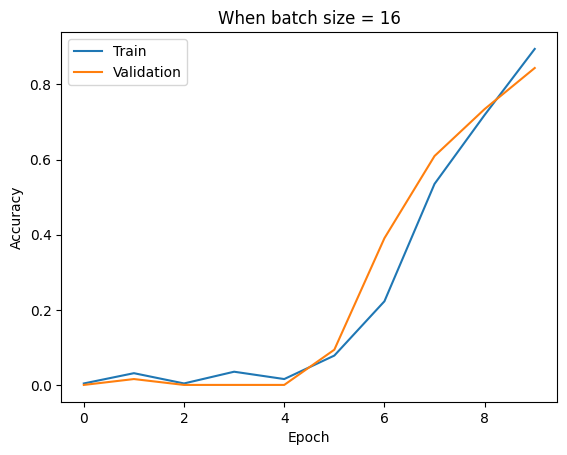

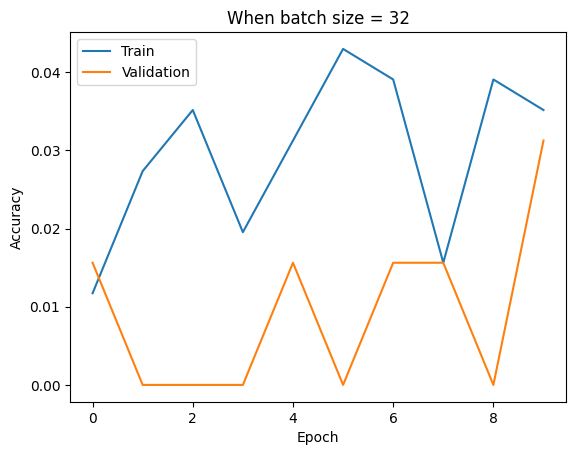

In [21]:
Valaccuracy2 = H5.history["val_accuracy"][9]
print("Final Validation Accuracy When batch size = 16:",Valaccuracy2)
Valaccuracy2 = H1.history["val_accuracy"][9]
print("Final Validation Accuracy When batch size = 32:",Valaccuracy2)

# Plot the difference between training and validation accuracy for each epoch, batch size = 16
plt.plot(H5.history['accuracy'])
plt.plot(H5.history['val_accuracy'])
plt.title('When batch size = 16')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot the difference between training and validation accuracy for each epoch, batch size = 32
plt.plot(H1.history['accuracy'])
plt.plot(H1.history['val_accuracy'])
plt.title('When batch size = 32')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

**we conclude that when the batch size increase the final validation accuracy decrease, as you can see in the graph**

# Question 9: 
For the best network architecture change the number of epochs to 5 and 20 and share
the final validation accuracy for 5, 10 and 20 epochs. What do the results highlight?

(400, 64, 64)
(400,)
40
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_30 (Conv2D)          (None, 64, 64, 8)         208       
                                                                 
 max_pooling2d_30 (MaxPooli  (None, 16, 16, 8)         0         
 ng2D)                                                           
                                                                 
 conv2d_31 (Conv2D)          (None, 16, 16, 16)        3216      
                                                                 
 max_pooling2d_31 (MaxPooli  (None, 4, 4, 16)          0         
 ng2D)                                                           
                                                                 
 conv2d_32 (Conv2D)          (None, 4, 4, 32)          4640      
                                                                 
 max_pooling2d_32 (MaxPooli  

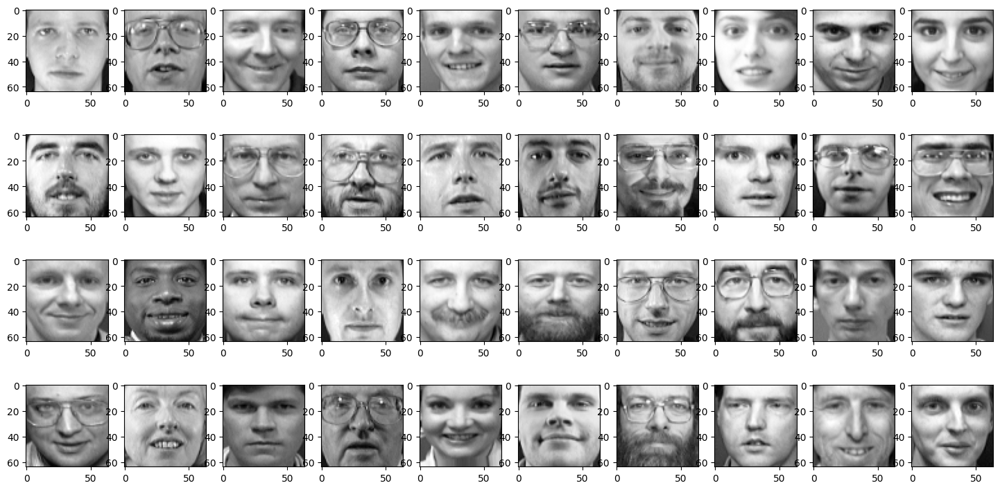

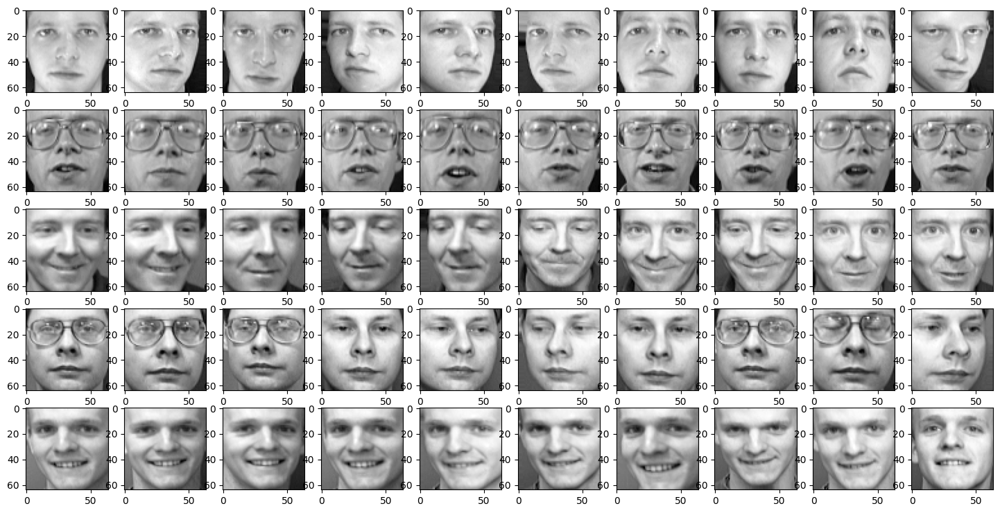

In [22]:
# Standard scientific Python imports
import numpy as np
import matplotlib.pyplot as plt
 
#Load data, face images and their target i.e. perosn number 
data = np.load("/kaggle/input/projectann/olivetti_faces.npy")
target = np.load("/kaggle/input/projectann/olivetti_faces_target.npy")

#print the size of data and target
#Data has 400 images of size 64 x 64 pixels (grayscale)
#Target has information about class of all 400 images
print(data.shape)
print(target.shape)

#Identity number of unique persons (ids) in the trarget data 
#For ORL / Olivetti face dataset this there are 40 people
#The dataset contains 10 images of each person. Therefore 40 x 10 = 400 images
unique_ids=np.unique(target)
print(len(unique_ids))

#Display one sample image for each person
#Display the 40 images in 4 rows with each row having 10 images
fig, axarr = plt.subplots(nrows=4, ncols=10, figsize=(18, 9))
axarr = axarr.flatten()
imgs=data
for id in unique_ids:
    img_id = id * 10
    axarr[id].imshow(imgs[img_id], cmap='gray')

#Display all 10 images of first 5 people
cols = 10
subject_ids=[0, 1, 2, 3, 4]
rows = (len(subject_ids)*10)//cols
fig, axarr = plt.subplots(nrows=rows, ncols=cols, figsize=(18, 9))
for i, subject_ids in enumerate(subject_ids):
    for j in range(cols):
        img_id = subject_ids*10 + j
        axarr[i, j].imshow(imgs[img_id], cmap='gray')

#Split the data into test and train data. Select test size = 20%
#Use sklearn library to split data into trianing and testing set
#X_train contains the image information and Y_train contains the target label (class)
#from sklearn.model_selection import train_test_split
#X_train, X_test, Y_train, Y_test = train_test_split(data, target, test_size = 0.2, random_state= 0)

#For training the data has to be split into training and validation, Split training data into training and validation set
#Set validation data size = 20% of training data
#X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size = 0.2, random_state = 0)

#Import keras for building the Convolutional Neural Network
from keras import utils as np_utils
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Dense, Dropout, Activation, Flatten

#Split the data into test and train data. Select test size = 20%
from sklearn.model_selection import train_test_split
target = np.load("/kaggle/input/projectann/olivetti_faces_target.npy")
target = np_utils.to_categorical(target, len(np.unique(target)))

#Use sklearn library to split data into trianing and testing set
#X_train contains the image information and Y_train contains the target label (class)
X_train, X_test, Y_train, Y_test = train_test_split(data, target, test_size = 0.2, random_state= 0)

#For training the data has to be split into training and validation, Split training data into training and validation set
#Set validation data size = 20% of training data
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size = 0.2, random_state = 0)

#target.shape

#Remember the third dimension is important for keras so specify that third dimension is 1   
X_train = X_train.reshape(X_train.shape[0], 64, 64, 1)
X_val = X_val.reshape(X_val.shape[0], 64, 64, 1)
X_test = X_test.reshape(X_test.shape[0], 64, 64, 1)


#Define the architecture of the convolutional neural network
model = Sequential()
#Add a conv layer having 8 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(8, (5, 5), activation='relu', input_shape=(64, 64, 1), padding='same'))
#Reduce the size of the images by 4 using maxpooling layer (image size 16 x 16)
model.add(MaxPooling2D(pool_size=(4, 4)))
#Add a conv layer having 16 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(16, (5, 5), activation='relu', padding='same'))
#Reduce the size of the images by 4 using maxpooling layer (image size 4 x 4)
model.add(MaxPooling2D(pool_size=(4, 4)))
#Add a conv layer having 16 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
#Reduce the size of the images by 2 using maxpooling layer (image size 2 x 2)
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(256, activation='sigmoid'))
#Pass data through a softmax layer
model.add(Dense(40, activation='softmax'))
#Since there are more than 2 classes use categorical_crossentropy, adam optimization and optimize based upon accuracy value
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

#Print a summary of the model
model.summary()

#Train the network using the above deinfed network architecture and give accuracy results for training and validation data
H6 = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=32, epochs=5, verbose=1)

(400, 64, 64)
(400,)
40
Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_33 (Conv2D)          (None, 64, 64, 8)         208       
                                                                 
 max_pooling2d_33 (MaxPooli  (None, 16, 16, 8)         0         
 ng2D)                                                           
                                                                 
 conv2d_34 (Conv2D)          (None, 16, 16, 16)        3216      
                                                                 
 max_pooling2d_34 (MaxPooli  (None, 4, 4, 16)          0         
 ng2D)                                                           
                                                                 
 conv2d_35 (Conv2D)          (None, 4, 4, 32)          4640      
                                                                 
 max_pooling2d_35 (MaxPooli  

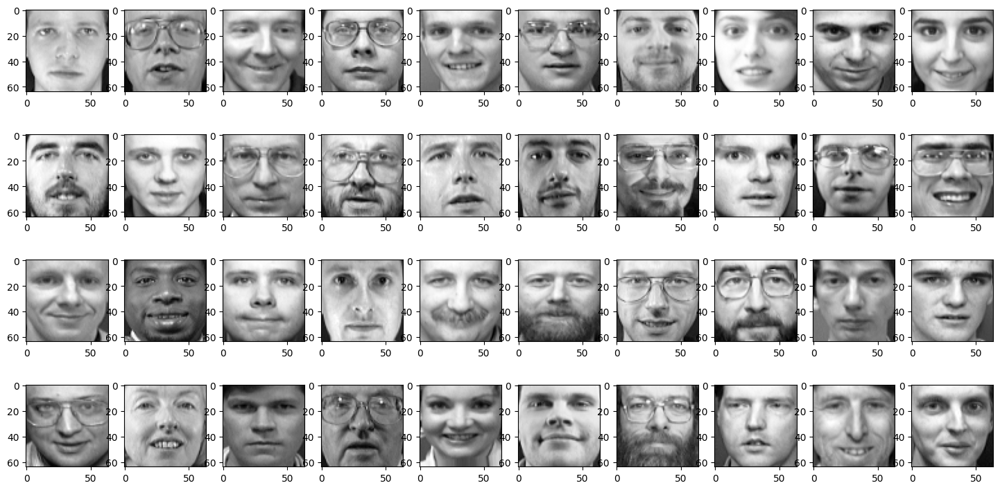

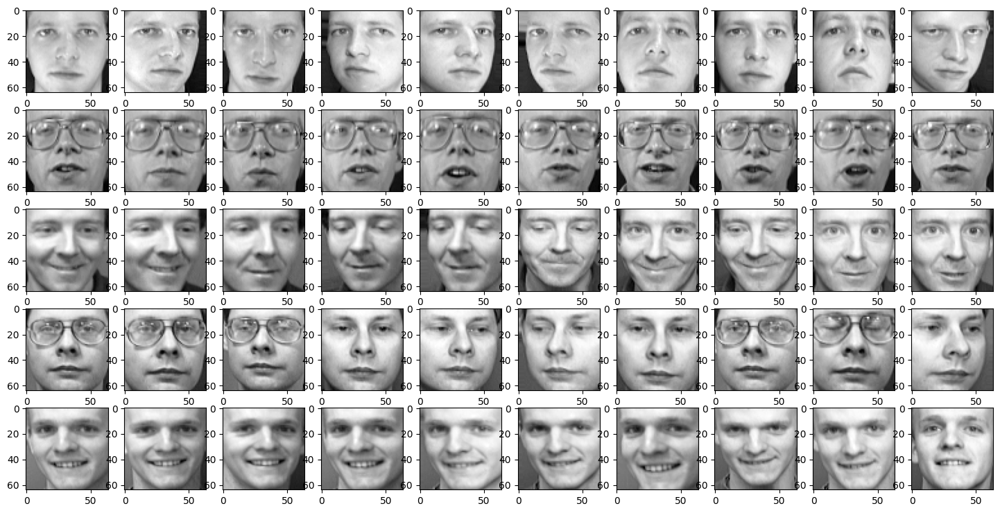

In [23]:
# Standard scientific Python imports
import numpy as np
import matplotlib.pyplot as plt
 
#Load data, face images and their target i.e. perosn number 
data = np.load("/kaggle/input/projectann/olivetti_faces.npy")
target = np.load("/kaggle/input/projectann/olivetti_faces_target.npy")

#print the size of data and target
#Data has 400 images of size 64 x 64 pixels (grayscale)
#Target has information about class of all 400 images
print(data.shape)
print(target.shape)

#Identity number of unique persons (ids) in the trarget data 
#For ORL / Olivetti face dataset this there are 40 people
#The dataset contains 10 images of each person. Therefore 40 x 10 = 400 images
unique_ids=np.unique(target)
print(len(unique_ids))

#Display one sample image for each person
#Display the 40 images in 4 rows with each row having 10 images
fig, axarr = plt.subplots(nrows=4, ncols=10, figsize=(18, 9))
axarr = axarr.flatten()
imgs=data
for id in unique_ids:
    img_id = id * 10
    axarr[id].imshow(imgs[img_id], cmap='gray')

#Display all 10 images of first 5 people
cols = 10
subject_ids=[0, 1, 2, 3, 4]
rows = (len(subject_ids)*10)//cols
fig, axarr = plt.subplots(nrows=rows, ncols=cols, figsize=(18, 9))
for i, subject_ids in enumerate(subject_ids):
    for j in range(cols):
        img_id = subject_ids*10 + j
        axarr[i, j].imshow(imgs[img_id], cmap='gray')

#Split the data into test and train data. Select test size = 20%
#Use sklearn library to split data into trianing and testing set
#X_train contains the image information and Y_train contains the target label (class)
#from sklearn.model_selection import train_test_split
#X_train, X_test, Y_train, Y_test = train_test_split(data, target, test_size = 0.2, random_state= 0)

#For training the data has to be split into training and validation, Split training data into training and validation set
#Set validation data size = 20% of training data
#X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size = 0.2, random_state = 0)

#Import keras for building the Convolutional Neural Network
from keras import utils as np_utils
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Dense, Dropout, Activation, Flatten

#Split the data into test and train data. Select test size = 20%
from sklearn.model_selection import train_test_split
target = np.load("/kaggle/input/projectann/olivetti_faces_target.npy")
target = np_utils.to_categorical(target, len(np.unique(target)))

#Use sklearn library to split data into trianing and testing set
#X_train contains the image information and Y_train contains the target label (class)
X_train, X_test, Y_train, Y_test = train_test_split(data, target, test_size = 0.2, random_state= 0)

#For training the data has to be split into training and validation, Split training data into training and validation set
#Set validation data size = 20% of training data
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size = 0.2, random_state = 0)

#target.shape

#Remember the third dimension is important for keras so specify that third dimension is 1   
X_train = X_train.reshape(X_train.shape[0], 64, 64, 1)
X_val = X_val.reshape(X_val.shape[0], 64, 64, 1)
X_test = X_test.reshape(X_test.shape[0], 64, 64, 1)


#Define the architecture of the convolutional neural network
model = Sequential()
#Add a conv layer having 8 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(8, (5, 5), activation='relu', input_shape=(64, 64, 1), padding='same'))
#Reduce the size of the images by 4 using maxpooling layer (image size 16 x 16)
model.add(MaxPooling2D(pool_size=(4, 4)))
#Add a conv layer having 16 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(16, (5, 5), activation='relu', padding='same'))
#Reduce the size of the images by 4 using maxpooling layer (image size 4 x 4)
model.add(MaxPooling2D(pool_size=(4, 4)))
#Add a conv layer having 16 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
#Reduce the size of the images by 2 using maxpooling layer (image size 2 x 2)
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(256, activation='sigmoid'))
#Pass data through a softmax layer
model.add(Dense(40, activation='softmax'))
#Since there are more than 2 classes use categorical_crossentropy, adam optimization and optimize based upon accuracy value
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

#Print a summary of the model
model.summary()

#Train the network using the above deinfed network architecture and give accuracy results for training and validation data
H7 = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=32, epochs=20, verbose=1)


In [24]:
#final validation accuracy when epoch = 5
Valaccuracy2 = H6.history["val_accuracy"][4]
print("final Validaion Accuracy when epoch = 5:",Valaccuracy2)

final Validaion Accuracy when epoch = 5: 0.0


In [25]:
#final validation accuracy when epoch = 10

Valaccuracy2 = H1.history["val_accuracy"][9]
print("final Validaion Accuracy when epoch = 10:",Valaccuracy2)

final Validaion Accuracy when epoch = 10: 0.03125


In [26]:
#final validation accuracy when epoch = 20

Valaccuracy2 = H7.history["val_accuracy"][19]
print("final Validaion Accuracy when epoch = 20:",Valaccuracy2)

final Validaion Accuracy when epoch = 20: 0.171875


**we notice that when the validation Accuracy increase by increasing the epoch**

# Question 10: 
For the best network architecture and batch size =16 and epochs =10, change the test
data size to 40% and share what is the effect on validation accuracy of the algorithm?

(400, 64, 64)
(400,)
40
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_36 (Conv2D)          (None, 64, 64, 8)         400       
                                                                 
 max_pooling2d_36 (MaxPooli  (None, 32, 32, 8)         0         
 ng2D)                                                           
                                                                 
 conv2d_37 (Conv2D)          (None, 32, 32, 32)        12576     
                                                                 
 max_pooling2d_37 (MaxPooli  (None, 16, 16, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_38 (Conv2D)          (None, 16, 16, 64)        51264     
                                                                 
 max_pooling2d_38 (MaxPooli  

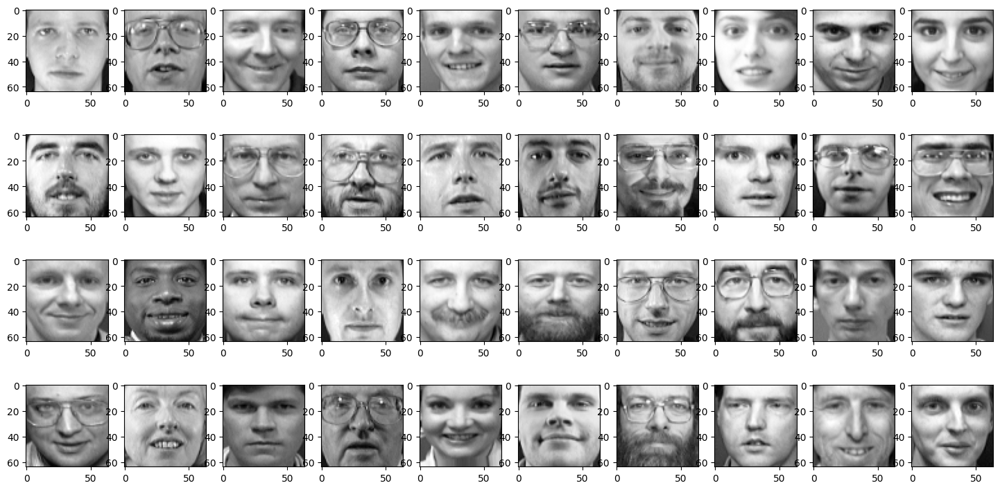

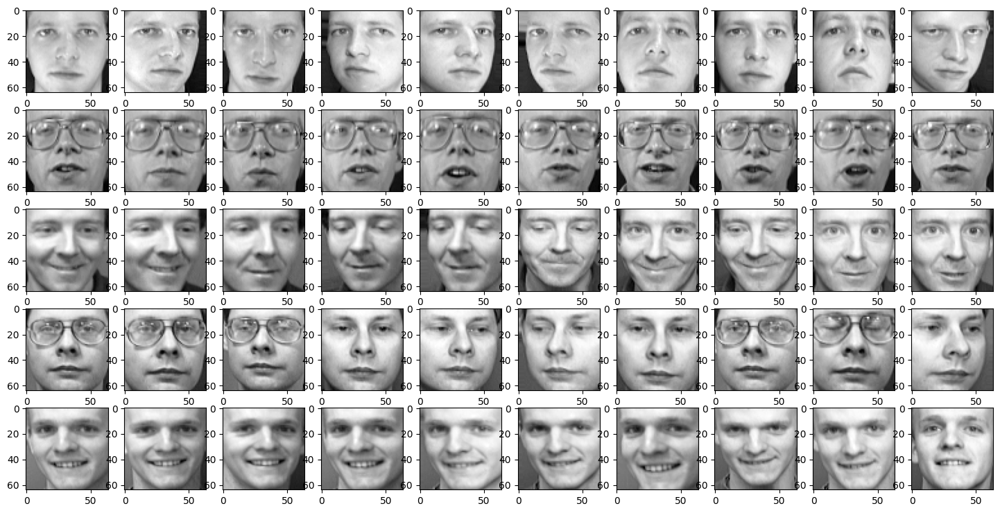

In [27]:
# Standard scientific Python imports
import numpy as np
import matplotlib.pyplot as plt
 
#Load data, face images and their target i.e. perosn number 
data = np.load("/kaggle/input/projectann/olivetti_faces.npy")
target = np.load("/kaggle/input/projectann/olivetti_faces_target.npy")

#print the size of data and target
#Data has 400 images of size 64 x 64 pixels (grayscale)
#Target has information about class of all 400 images
print(data.shape)
print(target.shape)

#Identity number of unique persons (ids) in the trarget data 
#For ORL / Olivetti face dataset this there are 40 people
#The dataset contains 10 images of each person. Therefore 40 x 10 = 400 images
unique_ids=np.unique(target)
print(len(unique_ids))

#Display one sample image for each person
#Display the 40 images in 4 rows with each row having 10 images
fig, axarr = plt.subplots(nrows=4, ncols=10, figsize=(18, 9))
axarr = axarr.flatten()
imgs=data
for id in unique_ids:
    img_id = id * 10
    axarr[id].imshow(imgs[img_id], cmap='gray')

#Display all 10 images of first 5 people
cols = 10
subject_ids=[0, 1, 2, 3, 4]
rows = (len(subject_ids)*10)//cols
fig, axarr = plt.subplots(nrows=rows, ncols=cols, figsize=(18, 9))
for i, subject_ids in enumerate(subject_ids):
    for j in range(cols):
        img_id = subject_ids*10 + j
        axarr[i, j].imshow(imgs[img_id], cmap='gray')

#Split the data into test and train data. Select test size = 40%
#Use sklearn library to split data into trianing and testing set
#X_train contains the image information and Y_train contains the target label (class)
#from sklearn.model_selection import train_test_split
#X_train, X_test, Y_train, Y_test = train_test_split(data, target, test_size = 0.4, random_state= 0)

#For training the data has to be split into training and validation, Split training data into training and validation set
#Set validation data size = 20% of training data
#X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size = 0.2, random_state = 0)

#Import keras for building the Convolutional Neural Network
from keras import utils as np_utils
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Dense, Dropout, Activation, Flatten

#Split the data into test and train data. Select test size = 20%
from sklearn.model_selection import train_test_split
target = np.load("/kaggle/input/projectann/olivetti_faces_target.npy")
target = np_utils.to_categorical(target, len(np.unique(target)))

#Use sklearn library to split data into trianing and testing set
#X_train contains the image information and Y_train contains the target label (class)
X_train, X_test, Y_train, Y_test = train_test_split(data, target, test_size = 0.4, random_state= 0)

#For training the data has to be split into training and validation, Split training data into training and validation set
#Set validation data size = 20% of training data
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size = 0.2, random_state = 0)

#target.shape

#Remember the third dimension is important for keras so specify that third dimension is 1   
X_train = X_train.reshape(X_train.shape[0], 64, 64, 1)
X_val = X_val.reshape(X_val.shape[0], 64, 64, 1)
X_test = X_test.reshape(X_test.shape[0], 64, 64, 1)


#Define the architecture of the convolutional neural network
model = Sequential()
#Add a conv layer having 16 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(8, (7, 7), activation='relu', input_shape=(64, 64, 1), padding='same'))
#Reduce the size of the images by 4 using maxpooling layer (image size 16 x 16)
model.add(MaxPooling2D(pool_size=(2, 2)))
#Add a conv layer having 32 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(32, (7, 7), activation='relu', padding='same'))
#Reduce the size of the images by 4 using maxpooling layer (image size 4 x 4)
model.add(MaxPooling2D(pool_size=(2, 2)))
#Add a conv layer having 64 filters followed by a relu layer (image size 64 x 64) 
model.add(Conv2D(64, (5, 5), activation='relu', padding='same'))
#Reduce the size of the images by 2 using maxpooling layer (image size 2 x 2)
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(256, activation='sigmoid'))
#Pass data through a softmax layer
model.add(Dense(40, activation='softmax'))
#Since there are more than 2 classes use categorical_crossentropy, adam optimization and optimize based upon accuracy value
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

#Print a summary of the model
model.summary()

#Train the network using the above deinfed network architecture and give accuracy results for training and validation data
H8 = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=16, epochs=10, verbose=1)


In [28]:
Valaccuracy2 = H8.history["val_accuracy"][0]
print("Initial Validaion Accuracy:",Valaccuracy2)

Valaccuracy4 = H8.history["val_accuracy"][9]
print("Final Validaion Accuracy:",Valaccuracy4)


Initial Validaion Accuracy: 0.0416666679084301
Final Validaion Accuracy: 0.5833333134651184


**The Validaion Accuracy was Decrease when we change the test size to 40% and the batch size to 16 and epoch is 10 (Comparing to Question8)**